``Get data through STAC api``

# Import dependencies and meatadata

In [89]:
import planetary_computer as pc
from pystac_client.client import Client
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import geopandas as gpd
import geopy.distance as distance
from geopy.distance import geodesic
from datetime import timedelta


import cv2
import odc.stac

import rioxarray
import rasterio as rio
from tqdm import tqdm
from pathlib import Path
from IPython.display import Image
from PIL import Image as PILImage

import sys
sys.path.append('../')
from src.utils import get_bounding_box, get_date_range, crop_sentinel_image, crop_landsat_image

In [4]:
catalog = Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1", modifier=pc.sign_inplace
)

In [5]:
train_labels = pd.read_csv('../data/train_labels.csv')
metadata = pd.read_csv('../data/metadata.csv')
metadata.head()

,uid,latitude,longitude,date,split
0,aabm,39.080319,-86.430867,2018-05-14,train
1,aabn,36.559700,-121.510000,2016-08-31,test
2,aacd,35.875083,-78.878434,2020-11-19,train
3,aaee,35.487000,-79.062133,2016-08-24,train
4,aaff,38.049471,-99.827001,2019-07-23,train


In [6]:
example_row = metadata[metadata.uid == "garm"].iloc[0]
example_row

uid                garm
latitude       41.98006
longitude    -110.65734
date         2021-09-27
split             train
Name: 5461, dtype: object

# Xplore odc-stac

- What would be the best images to pull?
- What is the best way to pull them?


In [7]:
bbox = get_bounding_box(example_row.latitude, example_row.longitude, meter_buffer=50_000)
date_range = get_date_range(example_row.date)

bbox, date_range

([-111.26063646639783,
  41.52988747516146,
  -110.05404353360218,
  42.43019710235757],
 '2021-09-12T/2021-09-27T')

In [16]:
x = {"type":"Catalog","id":"microsoft-pc","title":"Microsoft Planetary Computer STAC API","description":"Searchable spatiotemporal metadata describing Earth science datasets hosted by the Microsoft Planetary Computer","stac_version":"1.0.0","conformsTo":["http://www.opengis.net/spec/ogcapi-features-1/1.0/conf/core","http://www.opengis.net/spec/ogcapi-features-1/1.0/conf/geojson","http://www.opengis.net/spec/ogcapi-features-1/1.0/conf/oas30","https://api.stacspec.org/v1.0.0-rc.1/collections","https://api.stacspec.org/v1.0.0-rc.1/core","https://api.stacspec.org/v1.0.0-rc.1/item-search","https://api.stacspec.org/v1.0.0-rc.1/item-search#fields","https://api.stacspec.org/v1.0.0-rc.1/item-search#filter:basic-cql","https://api.stacspec.org/v1.0.0-rc.1/item-search#filter:cql-json","https://api.stacspec.org/v1.0.0-rc.1/item-search#filter:cql-text","https://api.stacspec.org/v1.0.0-rc.1/item-search#filter:filter","https://api.stacspec.org/v1.0.0-rc.1/item-search#filter:item-search-filter","https://api.stacspec.org/v1.0.0-rc.1/item-search#query","https://api.stacspec.org/v1.0.0-rc.1/item-search#sort","https://api.stacspec.org/v1.0.0-rc.1/ogcapi-features"],"links":[{"rel":"self","type":"application/json","href":"https://planetarycomputer.microsoft.com/api/stac/v1/"},{"rel":"root","type":"application/json","href":"https://planetarycomputer.microsoft.com/api/stac/v1/"},{"rel":"data","type":"application/json","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections"},{"rel":"conformance","type":"application/json","title":"STAC/WFS3 conformance classes implemented by this server","href":"https://planetarycomputer.microsoft.com/api/stac/v1/conformance"},{"rel":"search","type":"application/geo+json","title":"STAC search","href":"https://planetarycomputer.microsoft.com/api/stac/v1/search","method":"GET"},{"rel":"search","type":"application/geo+json","title":"STAC search","href":"https://planetarycomputer.microsoft.com/api/stac/v1/search","method":"POST"},{"rel":"child","type":"application/json","title":"Daymet Annual Puerto Rico","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/daymet-annual-pr"},{"rel":"child","type":"application/json","title":"Daymet Daily Hawaii","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/daymet-daily-hi"},{"rel":"child","type":"application/json","title":"USGS 3DEP Seamless DEMs","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/3dep-seamless"},{"rel":"child","type":"application/json","title":"Urban Innovation Eclipse Sensor Data","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/eclipse"},{"rel":"child","type":"application/json","title":"USGS 3DEP Lidar Digital Surface Model","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/3dep-lidar-dsm"},{"rel":"child","type":"application/json","title":"Forest Inventory and Analysis","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/fia"},{"rel":"child","type":"application/json","title":"ESA WorldCover 2020","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/esa-worldcover"},{"rel":"child","type":"application/json","title":"Sentinel 1 Radiometrically Terrain Corrected (RTC)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/sentinel-1-rtc"},{"rel":"child","type":"application/json","title":"GOES-R Cloud & Moisture Imagery","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/goes-cmi"},{"rel":"child","type":"application/json","title":"gridMET","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/gridmet"},{"rel":"child","type":"application/json","title":"Daymet Annual North America","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/daymet-annual-na"},{"rel":"child","type":"application/json","title":"Daymet Monthly North America","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/daymet-monthly-na"},{"rel":"child","type":"application/json","title":"Daymet Annual Hawaii","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/daymet-annual-hi"},{"rel":"child","type":"application/json","title":"Daymet Monthly Hawaii","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/daymet-monthly-hi"},{"rel":"child","type":"application/json","title":"Daymet Monthly Puerto Rico","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/daymet-monthly-pr"},{"rel":"child","type":"application/json","title":"gNATSGO Soil Database - Tables","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/gnatsgo-tables"},{"rel":"child","type":"application/json","title":"CIL Global Downscaled Projections for Climate Impacts Research (CC-BY-4.0)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/cil-gdpcir-cc-by"},{"rel":"child","type":"application/json","title":"TerraClimate","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/terraclimate"},{"rel":"child","type":"application/json","title":"HGB: Harmonized Global Biomass for 2010","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/hgb"},{"rel":"child","type":"application/json","title":"Copernicus DEM GLO-30","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/cop-dem-glo-30"},{"rel":"child","type":"application/json","title":"Copernicus DEM GLO-90","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/cop-dem-glo-90"},{"rel":"child","type":"application/json","title":"Earth Exchange Global Daily Downscaled Projections (NEX-GDDP-CMIP6)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/nasa-nex-gddp-cmip6"},{"rel":"child","type":"application/json","title":"GPM IMERG","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/gpm-imerg-hhr"},{"rel":"child","type":"application/json","title":"10m Annual Land Use Land Cover (9-class)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/io-lulc-9-class"},{"rel":"child","type":"application/json","title":"gNATSGO Soil Database - Rasters","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/gnatsgo-rasters"},{"rel":"child","type":"application/json","title":"USGS 3DEP Lidar Height above Ground","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/3dep-lidar-hag"},{"rel":"child","type":"application/json","title":"USGS 3DEP Lidar Intensity","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/3dep-lidar-intensity"},{"rel":"child","type":"application/json","title":"USGS 3DEP Lidar Point Source","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/3dep-lidar-pointsourceid"},{"rel":"child","type":"application/json","title":"MTBS: Monitoring Trends in Burn Severity","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/mtbs"},{"rel":"child","type":"application/json","title":"CIL Global Downscaled Projections for Climate Impacts Research (CC0-1.0)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/cil-gdpcir-cc0"},{"rel":"child","type":"application/json","title":"Landsat 8 Collection 2 Level-2","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/landsat-8-c2-l2"},{"rel":"child","type":"application/json","title":"C-CAP Regional Land Cover and Change","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/noaa-c-cap"},{"rel":"child","type":"application/json","title":"USGS 3DEP Lidar Point Cloud","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/3dep-lidar-copc"},{"rel":"child","type":"application/json","title":"MODIS Burned Area Monthly","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/modis-64A1-061"},{"rel":"child","type":"application/json","title":"ALOS Forest/Non-Forest Annual Mosaic","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/alos-fnf-mosaic"},{"rel":"child","type":"application/json","title":"USGS 3DEP Lidar Returns","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/3dep-lidar-returns"},{"rel":"child","type":"application/json","title":"MoBI: Map of Biodiversity Importance","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/mobi"},{"rel":"child","type":"application/json","title":"Landsat Collection 2 Level-2","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/landsat-c2-l2"},{"rel":"child","type":"application/json","title":"ERA5 - PDS","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/era5-pds"},{"rel":"child","type":"application/json","title":"NAIP: National Agriculture Imagery Program","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/naip"},{"rel":"child","type":"application/json","title":"Chloris Biomass","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/chloris-biomass"},{"rel":"child","type":"application/json","title":"MODIS Gross Primary Productivity 8-Day","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/modis-17A2H-061"},{"rel":"child","type":"application/json","title":"MODIS Land Surface Temperature/Emissivity 8-Day","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/modis-11A2-061"},{"rel":"child","type":"application/json","title":"Daymet Daily Puerto Rico","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/daymet-daily-pr"},{"rel":"child","type":"application/json","title":"USGS 3DEP Lidar Digital Terrain Model (Native)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/3dep-lidar-dtm-native"},{"rel":"child","type":"application/json","title":"USGS 3DEP Lidar Classification","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/3dep-lidar-classification"},{"rel":"child","type":"application/json","title":"USGS 3DEP Lidar Digital Terrain Model","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/3dep-lidar-dtm"},{"rel":"child","type":"application/json","title":"CIL Global Downscaled Projections for Climate Impacts Research (CC-BY-SA-4.0)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/cil-gdpcir-cc-by-sa"},{"rel":"child","type":"application/json","title":"USGS Gap Land Cover","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/gap"},{"rel":"child","type":"application/json","title":"MODIS Gross Primary Productivity 8-Day Gap-Filled","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/modis-17A2HGF-061"},{"rel":"child","type":"application/json","title":"MODIS Net Primary Production Yearly Gap-Filled","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/modis-17A3HGF-061"},{"rel":"child","type":"application/json","title":"MODIS Surface Reflectance 8-Day (500m)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/modis-09A1-061"},{"rel":"child","type":"application/json","title":"ALOS World 3D-30m","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/alos-dem"},{"rel":"child","type":"application/json","title":"ALOS PALSAR Annual Mosaic","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/alos-palsar-mosaic"},{"rel":"child","type":"application/json","title":"Microsoft Building Footprints","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/ms-buildings"},{"rel":"child","type":"application/json","title":"Deltares Global Water Availability","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/deltares-water-availability"},{"rel":"child","type":"application/json","title":"MODIS Net Evapotranspiration Yearly Gap-Filled","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/modis-16A3GF-061"},{"rel":"child","type":"application/json","title":"MODIS Land Surface Temperature/3-Band Emissivity 8-Day","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/modis-21A2-061"},{"rel":"child","type":"application/json","title":"HydroForecast - Kwando & Upper Zambezi Rivers","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/kaza-hydroforecast"},{"rel":"child","type":"application/json","title":"Planet-NICFI Basemaps (Analytic)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/planet-nicfi-analytic"},{"rel":"child","type":"application/json","title":"Planet-NICFI Basemaps (Visual)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/planet-nicfi-visual"},{"rel":"child","type":"application/json","title":"Global Biodiversity Information Facility (GBIF)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/gbif"},{"rel":"child","type":"application/json","title":"US Census","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/us-census"},{"rel":"child","type":"application/json","title":"JRC Global Surface Water","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/jrc-gsw"},{"rel":"child","type":"application/json","title":"Deltares Global Flood Maps","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/deltares-floods"},{"rel":"child","type":"application/json","title":"MODIS Nadir BRDF-Adjusted Reflectance (NBAR) Daily","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/modis-43A4-061"},{"rel":"child","type":"application/json","title":"MODIS Surface Reflectance 8-Day (250m)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/modis-09Q1-061"},{"rel":"child","type":"application/json","title":"MODIS Thermal Anomalies/Fire Daily","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/modis-14A1-061"},{"rel":"child","type":"application/json","title":"HREA: High Resolution Electricity Access","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/hrea"},{"rel":"child","type":"application/json","title":"MODIS Vegetation Indices 16-Day (250m)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/modis-13Q1-061"},{"rel":"child","type":"application/json","title":"MODIS Thermal Anomalies/Fire 8-Day","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/modis-14A2-061"},{"rel":"child","type":"application/json","title":"Sentinel-2 Level-2A","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/sentinel-2-l2a"},{"rel":"child","type":"application/json","title":"MODIS Leaf Area Index/FPAR 8-Day","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/modis-15A2H-061"},{"rel":"child","type":"application/json","title":"MODIS Land Surface Temperature/Emissivity Daily","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/modis-11A1-061"},{"rel":"child","type":"application/json","title":"MODIS Leaf Area Index/FPAR 4-Day","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/modis-15A3H-061"},{"rel":"child","type":"application/json","title":"MODIS Snow Cover 8-day","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/modis-10A2-061"},{"rel":"child","type":"application/json","title":"MODIS Snow Cover Daily","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/modis-10A1-061"},{"rel":"child","type":"application/json","title":"NOAA MRMS QPE 24-Hour Pass 2","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/noaa-mrms-qpe-24h-pass2"},{"rel":"child","type":"application/json","title":"MODIS Vegetation Indices 16-Day (500m)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/modis-13A1-061"},{"rel":"child","type":"application/json","title":"Daymet Daily North America","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/daymet-daily-na"},{"rel":"child","type":"application/json","title":"Land Cover of Canada","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/nrcan-landcover"},{"rel":"child","type":"application/json","title":"ECMWF Open Data (real-time)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/ecmwf-forecast"},{"rel":"child","type":"application/json","title":"Sentinel 1 Level-1 Ground Range Detected (GRD)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/sentinel-1-grd"},{"rel":"child","type":"application/json","title":"NASADEM HGT v001","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/nasadem"},{"rel":"child","type":"application/json","title":"Esri 10-Meter Land Cover (10-class)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/io-lulc"},{"rel":"child","type":"application/json","title":"Landsat Collection 2 Level-1","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/landsat-c2-l1"},{"rel":"child","type":"application/json","title":"ASTER L1T","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/aster-l1t"},{"rel":"child","type":"application/json","title":"Denver Regional Council of Governments Land Use Land Cover","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/drcog-lulc"},{"rel":"child","type":"application/json","title":"Chesapeake Land Cover (7-class)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/chesapeake-lc-7"},{"rel":"child","type":"application/json","title":"Chesapeake Land Cover (13-class)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/chesapeake-lc-13"},{"rel":"child","type":"application/json","title":"Chesapeake Land Use","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/chesapeake-lu"},{"rel":"child","type":"application/json","title":"NOAA MRMS QPE 1-Hour Pass 1","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/noaa-mrms-qpe-1h-pass1"},{"rel":"child","type":"application/json","title":"NOAA MRMS QPE 1-Hour Pass 2","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/noaa-mrms-qpe-1h-pass2"},{"rel":"child","type":"application/json","title":"Monthly NOAA U.S. Climate Gridded Dataset (NClimGrid)","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/noaa-nclimgrid-monthly"},{"rel":"child","type":"application/json","title":"GOES-R Lightning Detection","href":"https://planetarycomputer.microsoft.com/api/stac/v1/collections/goes-glm"},{"rel":"service-desc","type":"application/vnd.oai.openapi+json;version=3.0","title":"OpenAPI service description","href":"https://planetarycomputer.microsoft.com/api/stac/v1/openapi.json"},{"rel":"service-doc","type":"text/html","title":"OpenAPI service documentation","href":"https://planetarycomputer.microsoft.com/api/stac/v1/docs"}]}
from pprint import pprint
pprint(x)

{'conformsTo': ['http://www.opengis.net/spec/ogcapi-features-1/1.0/conf/core',
                'http://www.opengis.net/spec/ogcapi-features-1/1.0/conf/geojson',
                'http://www.opengis.net/spec/ogcapi-features-1/1.0/conf/oas30',
                'https://api.stacspec.org/v1.0.0-rc.1/collections',
                'https://api.stacspec.org/v1.0.0-rc.1/core',
                'https://api.stacspec.org/v1.0.0-rc.1/item-search',
                'https://api.stacspec.org/v1.0.0-rc.1/item-search#fields',
                'https://api.stacspec.org/v1.0.0-rc.1/item-search#filter:basic-cql',
                'https://api.stacspec.org/v1.0.0-rc.1/item-search#filter:cql-json',
                'https://api.stacspec.org/v1.0.0-rc.1/item-search#filter:cql-text',
                'https://api.stacspec.org/v1.0.0-rc.1/item-search#filter:filter',
                'https://api.stacspec.org/v1.0.0-rc.1/item-search#filter:item-search-filter',
                'https://api.stacspec.org/v1.0.0-rc.1/item

In [18]:
catalog.to_dict().keys()

dict_keys(['type', 'id', 'stac_version', 'description', 'links', 'stac_extensions', 'conformsTo', 'title'])

In [50]:
metadata.iloc[0][['latitude', 'longitude']].values

array([39.0803190688889, -86.4308666666667], dtype=object)

In [52]:
mydaterange = get_date_range(
    "2021-01-01",
    time_buffer_days=3
)


mybbox = get_bounding_box(39.0803190688889, -86.4308666666667, meter_buffer=500)
mybbox

[-86.43664511758249, 39.07581525298953, -86.42508821575092, 39.08482288129961]

In [54]:
srch = catalog.search(collections=['landsat-c2-l2'], datetime=mydaterange, bbox=mybbox)
myitems = [myitem for myitem in srch.get_all_items()]
len(myitems)

1

In [55]:
# search the planetary computer sentinel-l2a and landsat level-2 collections
search = catalog.search(
    collections=["sentinel-2-l2a", "landsat-c2-l2"], bbox=bbox, datetime=date_range
)

# see how many items were returned
items = [item for item in search.get_all_items()]
len(items)

46

In [10]:
# get details of all of the items returned into a dataframe
item_details = pd.DataFrame(
    [
        {
            "datetime": item.datetime.strftime("%Y-%m-%d"),
            "platform": item.properties["platform"],
            "min_long": item.bbox[0],
            "max_long": item.bbox[2],
            "min_lat": item.bbox[1],
            "max_lat": item.bbox[3],
            "bbox": item.bbox,
            "item_obj": item,
        }
        for item in items
    ]
)

# check which rows actually contain the sample location
item_details["contains_sample_point"] = (
    (item_details.min_lat < example_row.latitude)
    & (item_details.max_lat > example_row.latitude)
    & (item_details.min_long < example_row.longitude)
    & (item_details.max_long > example_row.longitude)
)

print(
    f"Filtering from {len(item_details)} returned to {item_details.contains_sample_point.sum()} items that contain the sample location"
)

item_details = item_details[item_details["contains_sample_point"]]
item_details[["datetime", "platform", "contains_sample_point", "bbox"]].sort_values(
    by="datetime"
)

Filtering from 46 returned to 7 items that contain the sample location


,datetime,platform,contains_sample_point,bbox
44,2021-09-12,landsat-8,True,"[-111.34023745, 40.67702495, -108.51528663, 42..."
34,2021-09-14,Sentinel-2A,True,"[-111.000244, 41.45624189757688, -109.665115, ..."
21,2021-09-19,Sentinel-2B,True,"[-111.000244, 41.45624189757688, -109.665115, ..."
26,2021-09-19,landsat-8,True,"[-112.92522743, 40.67353498, -110.06644659, 42..."
18,2021-09-20,landsat-7,True,"[-111.60018779, 40.80284495, -108.59831681, 42..."
8,2021-09-24,Sentinel-2A,True,"[-111.000244, 41.4562419, -109.665115, 42.4526..."
5,2021-09-27,landsat-7,True,"[-113.18385774, 40.78803499, -110.15150674, 42..."


In [11]:
# 1 - filter to sentinel
item_details[item_details.platform.str.contains("Sentinel")]

,datetime,platform,min_long,max_long,min_lat,max_lat,bbox,item_obj,contains_sample_point
8,2021-09-24,Sentinel-2A,-111.000244,-109.665115,41.456242,42.452691,"[-111.000244, 41.4562419, -109.665115, 42.4526...",<Item id=S2A_MSIL2A_20210924T181101_R084_T12TW...,True
21,2021-09-19,Sentinel-2B,-111.000244,-109.665115,41.456242,42.452691,"[-111.000244, 41.45624189757688, -109.665115, ...",<Item id=S2B_MSIL2A_20210919T180919_R084_T12TW...,True
34,2021-09-14,Sentinel-2A,-111.000244,-109.665115,41.456242,42.452691,"[-111.000244, 41.45624189757688, -109.665115, ...",<Item id=S2A_MSIL2A_20210914T180951_R084_T12TW...,True


In [12]:
# 2 - take closest by date
best_item = (
    item_details[item_details.platform.str.contains("Sentinel")]
    .sort_values(by="datetime", ascending=False)
    .iloc[0]
)
best_item

datetime                                                        2021-09-24
platform                                                       Sentinel-2A
min_long                                                       -111.000244
max_long                                                       -109.665115
min_lat                                                          41.456242
max_lat                                                          42.452691
bbox                     [-111.000244, 41.4562419, -109.665115, 42.4526...
item_obj                 <Item id=S2A_MSIL2A_20210924T181101_R084_T12TW...
contains_sample_point                                                 True
Name: 8, dtype: object

In [13]:
item = best_item.item_obj
item

ID: S2A_MSIL2A_20210924T181101_R084_T12TWM_20210925T141709
"Bounding Box: [-111.000244, 41.4562419, -109.665115, 42.4526912]"
Datetime: 2021-09-24 18:11:01.024000+00:00
datetime: 2021-09-24T18:11:01.024000Z
platform: Sentinel-2A
proj:epsg: 32612
instruments: ['msi']
s2:mgrs_tile: 12TWM
constellation: Sentinel 2
s2:granule_id: S2A_OPER_MSI_L2A_TL_ESRI_20210925T141710_A032685_T12TWM_N03.00
eo:cloud_cover: 0.171977


In [16]:
# What assets are available?
for asset_key, asset in item.assets.items():
    print(f"{asset_key :<25} - {asset.title}")

AOT                       - Aerosol optical thickness (AOT)
B01                       - Band 1 - Coastal aerosol - 60m
B02                       - Band 2 - Blue - 10m
B03                       - Band 3 - Green - 10m
B04                       - Band 4 - Red - 10m
B05                       - Band 5 - Vegetation red edge 1 - 20m
B06                       - Band 6 - Vegetation red edge 2 - 20m
B07                       - Band 7 - Vegetation red edge 3 - 20m
B08                       - Band 8 - NIR - 10m
B09                       - Band 9 - Water vapor - 60m
B11                       - Band 11 - SWIR (1.6) - 20m
B12                       - Band 12 - SWIR (2.2) - 20m
B8A                       - Band 8A - Vegetation red edge 4 - 20m
SCL                       - Scene classfication map (SCL)
WVP                       - Water vapour (WVP)
visual                    - True color image
preview                   - Thumbnail
safe-manifest             - SAFE manifest
granule-metadata          - Granul

In [18]:
# see the whole image
img = Image(url=item.assets["rendered_preview"].href, width=500)
img

In [20]:
# get a smaller geographic bounding box
minx, miny, maxx, maxy = get_bounding_box(
    example_row.latitude, example_row.longitude, meter_buffer=2_000
)

# get the zoomed in image array
bbox = (minx, miny, maxx, maxy)
zoomed_img_array = crop_sentinel_image(item, bbox)

zoomed_img_array[0]

array([[104, 107, 113, ...,  99,  93,  88],
       [102, 103, 112, ..., 104,  94,  89],
       [109, 108, 113, ..., 105,  96,  91],
       ...,
       [124, 121, 122, ..., 105, 105, 106],
       [130, 111, 109, ..., 102, 100, 104],
       [152, 135, 128, ..., 103, 101, 102]], dtype=uint8)

In [21]:
zoomed_img_array.shape

(3, 402, 402)

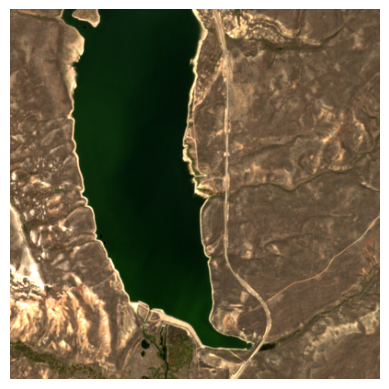

In [49]:
#  transpose some of the dimensions to plot
# matplotlib expects channels in a certain order
plt.imshow(np.transpose(zoomed_img_array, axes=[1, 2, 0]))
plt.axis('off');

In [22]:
landsat_item = (
    item_details[item_details.platform.str.contains("landsat")]
    .sample(n=1, random_state=3)
    .iloc[0]
)
landsat_item

datetime                                                        2021-09-12
platform                                                         landsat-8
min_long                                                       -111.340237
max_long                                                       -108.515287
min_lat                                                          40.677025
max_lat                                                          42.817595
bbox                     [-111.34023745, 40.67702495, -108.51528663, 42...
item_obj                         <Item id=LC08_L2SP_037031_20210912_02_T1>
contains_sample_point                                                 True
Name: 44, dtype: object

In [26]:
item = landsat_item.item_obj

# we'll use the same cropped area as above
landsat_image_array = crop_landsat_image(item, bbox)
landsat_image_array[0]

array([[88, 88, 92, ..., 84, 85, 84],
       [90, 91, 93, ..., 85, 88, 87],
       [91, 93, 94, ..., 86, 87, 87],
       ...,
       [95, 92, 97, ..., 92, 91, 92],
       [93, 90, 91, ..., 93, 91, 91],
       [94, 93, 91, ..., 92, 91, 90]], dtype=uint16)

In [27]:
landsat_image_array.shape

(3, 135, 134)

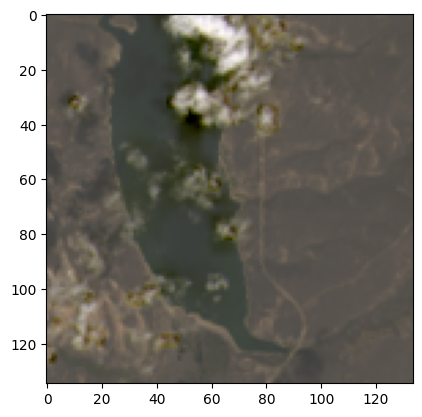

In [28]:
plt.imshow(np.transpose(landsat_image_array, axes=[1, 2, 0]))

In [30]:
image = odc.stac.stac_load(
    [pc.sign(item)], bands=["red", "green", "blue"], bbox=bbox
).isel(time=0)
image_array = image[["red", "green", "blue"]].to_array()

# values are not scaled 0 - 255 when first returned
image_array[0]

<xarray.DataArray (y: 135, x: 134)>
array([[10994, 10979, 11448, ..., 10523, 10576, 10505],
       [11163, 11362, 11575, ..., 10646, 10927, 10781],
       [11379, 11558, 11659, ..., 10734, 10827, 10859],
       ...,
       [11829, 11425, 12074, ..., 11499, 11365, 11424],
       [11556, 11260, 11322, ..., 11559, 11357, 11294],
       [11680, 11608, 11393, ..., 11477, 11398, 11255]], dtype=uint16)
Coordinates:
  * y            (y) float64 4.65e+06 4.65e+06 4.65e+06 ... 4.646e+06 4.646e+06
  * x            (x) float64 5.264e+05 5.264e+05 ... 5.304e+05 5.304e+05
    spatial_ref  int32 32612
    time         datetime64[ns] 2021-09-12T18:01:53.979983
    variable     <U3 'red'

In [31]:
image_array.shape

(3, 135, 134)

(526380.0, 530400.0, 4645590.0, 4649640.0)

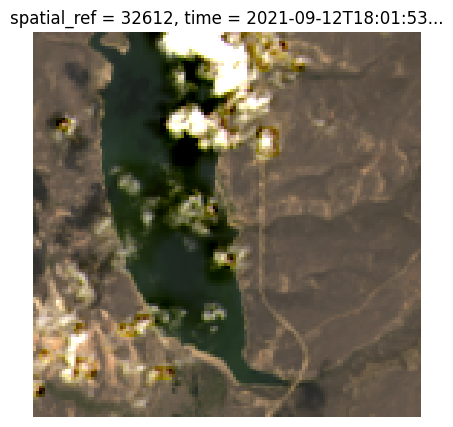

In [32]:
# image appears differently without rescaling
fig, ax = plt.subplots(figsize=(5, 5))
image_array.plot.imshow(robust=True, ax=ax)
plt.axis('off')

# Image Analysis

In [58]:
IMG_DIR = '../data/imgs/'

import os
files = os.listdir(IMG_DIR)
len(files)

89

In [9]:
def plot_randimg(choice):
    print(choice)
    file = files[choice]
    file_name = os.path.join(IMG_DIR, file)
    print(file)
    arr = np.load(file=file_name)
    print(arr.shape)
    plt.imshow(np.transpose(arr, axes=[1, 2, 0]))
    plt.axis('off');
    
    data = metadata[metadata.uid == file.split('.')[0]]
    x, y = data.latitude.values, data.longitude.values
    bbox = get_bounding_box(x, y, meter_buffer=2_000)

    print(train_labels[train_labels.uid == file.split('.')[0]])
    return file, arr, (x, y), bbox

73
tvne.npy
(3, 405, 406)
Empty DataFrame
Columns: [uid, region, severity, density]
Index: []


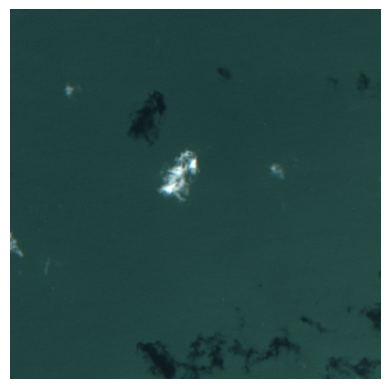

In [26]:
choice = np.random.choice([x for x in range(0, 90)])
_, _, _, _ = plot_randimg(choice)

3
bajg.npy
(3, 414, 415)
      uid region  severity  density
668  bajg   west         2  23916.0


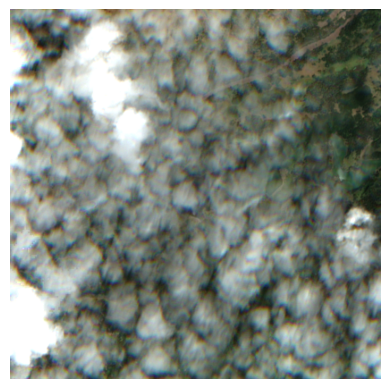

In [20]:
_, _, _, _ = plot_randimg(3)   # mostly cloudy... and could be of no use

45
nuqu.npy
(3, 409, 410)
       uid region  severity  density
9081  nuqu  south         1  19364.0


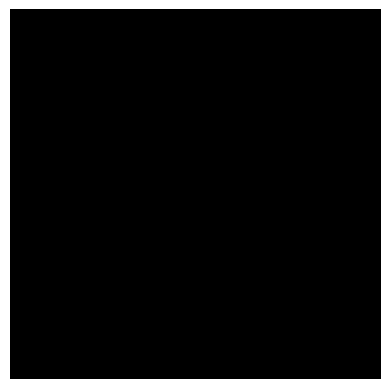

In [11]:
file, arr, (x, y), bbox = plot_randimg(45)
# not a pic of water body, 

14
egqx.npy
(3, 409, 409)
       uid region  severity  density
2822  egqx  south         1    484.0


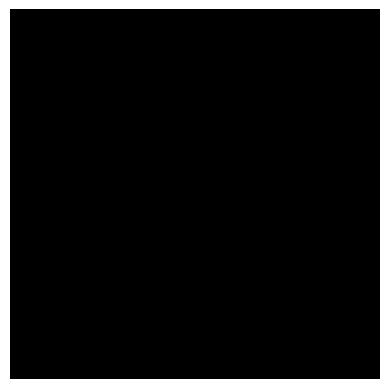

In [12]:
file, arr, (x, y), bbox = plot_randimg(14)
# the lat and long are not of a lake!! but why the black pic tho??!!

41
msdk.npy
(3, 411, 412)
Empty DataFrame
Columns: [uid, region, severity, density]
Index: []


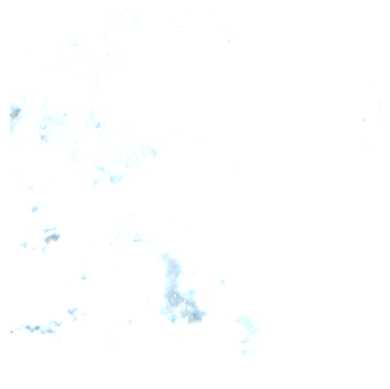

In [17]:
file, arr, (x, y), bbox = plot_randimg(41) # what the heckkk...

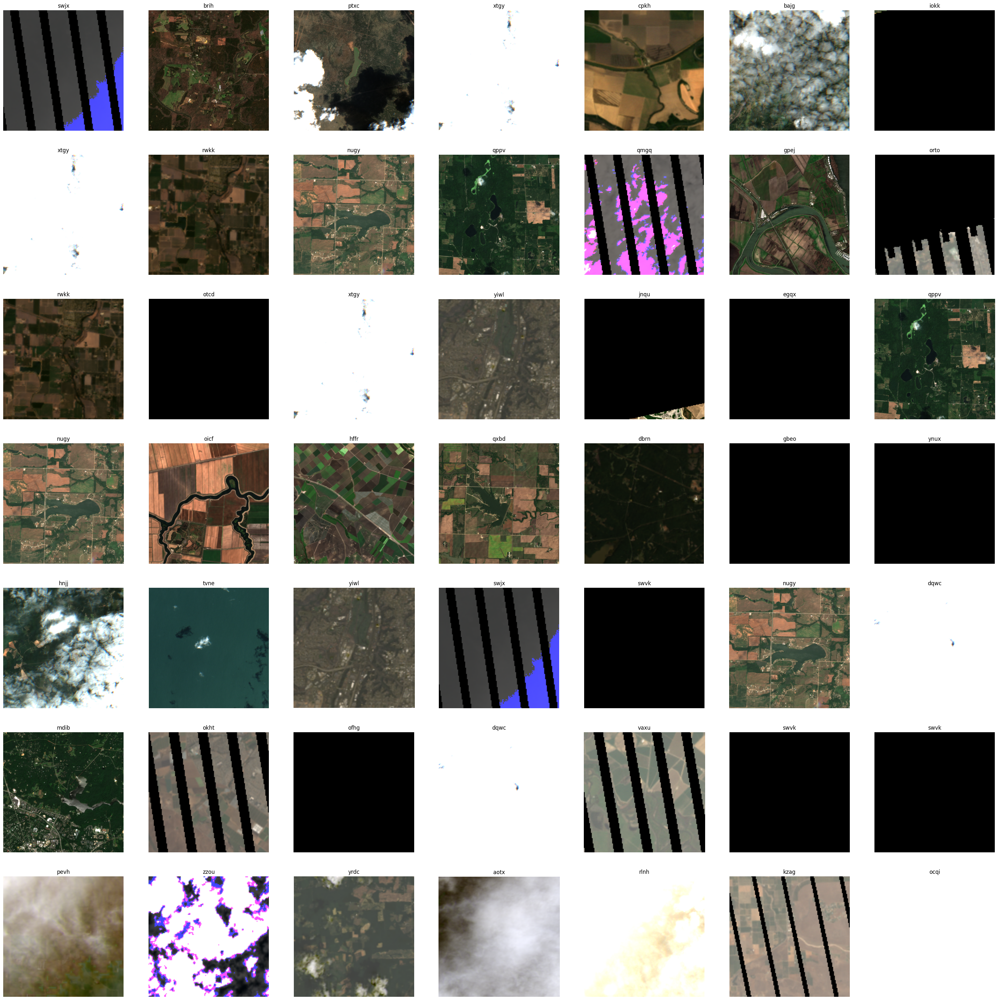

In [59]:
fig, axes = plt.subplots(7, 7, figsize=(40, 40))
for ax in axes.ravel():
    choice = np.random.choice([x for x in range(0, 90)])
    file_name = files[choice]
    img = np.load(f'../data/imgs/{file_name}')
    ax.imshow(np.transpose(img, axes=[2,1,0]))
    ax.set_xlabel(img.shape[1:])
    ax.axis('off');
    filename = file_name.split('.')[0]
    ax.title.set_text(filename)

In [ ]:
# Noo img is clear..!!

In [77]:
def get_img(file):
    display(metadata[metadata.uid == file])
    plt.imshow(np.transpose(np.load(f'../data/imgs/{file}.npy'), axes=[2, 1, 0]))
    plt.title(file)
    plt.axis('off');

What are these all whityy pics?

- are thesee clouds?
- are thesee satellite malfunctions?
- or some other thing??

,uid,latitude,longitude,date,split
21517,xtgy,35.8,-79.039492,2017-08-16,train


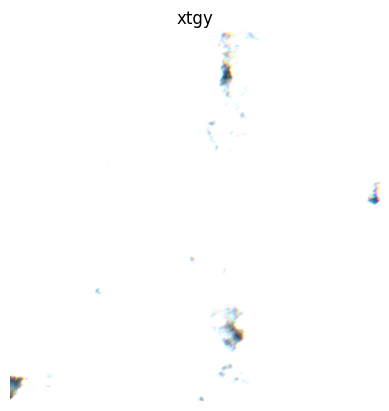

In [78]:
get_img('xtgy')

,uid,latitude,longitude,date,split
12796,ocqi,38.785,-121.653,2017-11-28,train


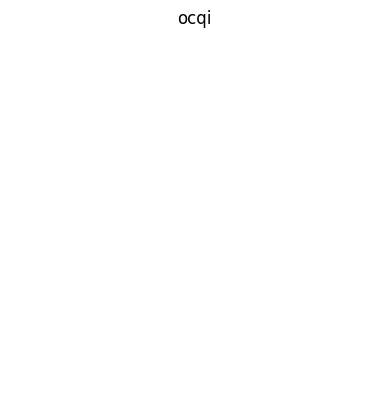

In [84]:
get_img('ocqi')

#  a very very narrow water canal!! But all whity tho??

,uid,latitude,longitude,date,split
3328,dqwc,47.513817,-87.545117,2018-08-23,test


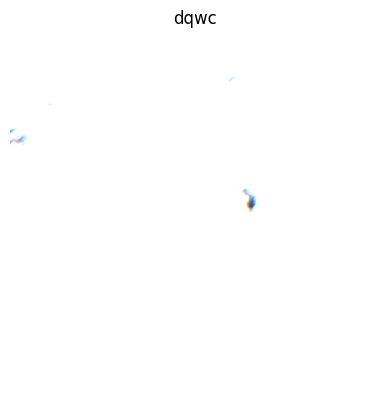

In [85]:
get_img('dqwc')


,uid,latitude,longitude,date,split
15856,rlnh,36.18,-79.053136,2018-05-30,train


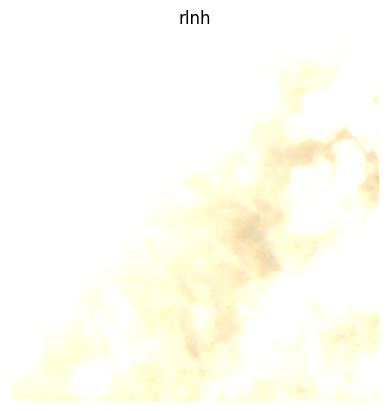

In [86]:
get_img('rlnh')

In [88]:
# # completly landimg nearest waterbody is 300km away
# geodesic((36.199636, -75.707325), (36.18, -79.053136)).km

# in fact there is but a very very very small waterbody!!!

300.93904104866243

What about these blackies??

- are thesee nighttimes?
- are thesee satellite malfunctions?

In [91]:
# iokk, otcd, orto, jnqu, egqx, ynux, gbeo, dbrn, ofhg, swvk
blackies = ['iokk', 'otcd', 'orto', 'jnqu', 'egqx', 'ynux', 'gbeo', 'dbrn', 'ofhg', 'swvk']
metadata[metadata.uid.isin(blackies)]

,uid,latitude,longitude,date,split
2766,dbrn,35.976000,-78.749928,2015-10-21,train
3884,egqx,35.611330,-78.973136,2016-05-25,train
5478,gbeo,35.714253,-79.148247,2016-05-11,train
7731,iokk,39.150576,-96.930349,2017-06-26,train
8615,jnqu,37.539400,-121.122000,2021-10-26,train
12894,ofhg,36.760500,-119.513000,2016-05-18,test
13346,orto,34.416800,-119.544000,2020-03-18,test
13402,otcd,35.724552,-79.129116,2016-07-20,train
17169,swvk,36.209830,-76.726770,2016-01-26,test
22261,ynux,35.976000,-78.756639,2016-04-13,train


,uid,latitude,longitude,date,split
7731,iokk,39.150576,-96.930349,2017-06-26,train


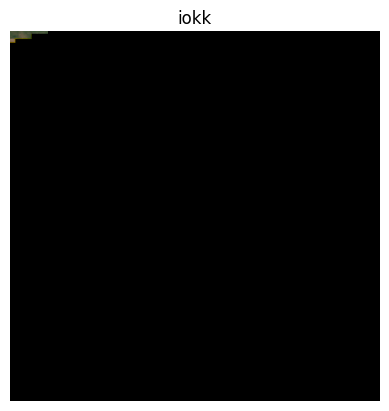

In [90]:
get_img('iokk')
#  the google img looks fine
# the left top pixels appear to be good! as is "jnqu"

,uid,latitude,longitude,date,split
13402,otcd,35.724552,-79.129116,2016-07-20,train


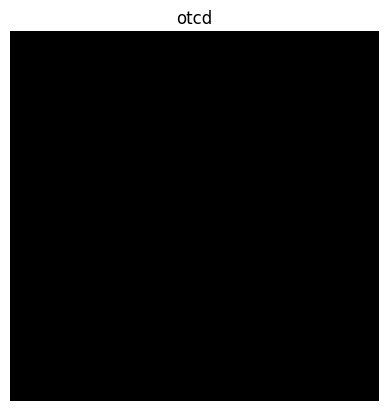

In [92]:
get_img('otcd')
#  a perfectly fine img on google map but :(

,uid,latitude,longitude,date,split
22261,ynux,35.976,-78.756639,2016-04-13,train


0.13479839042862257

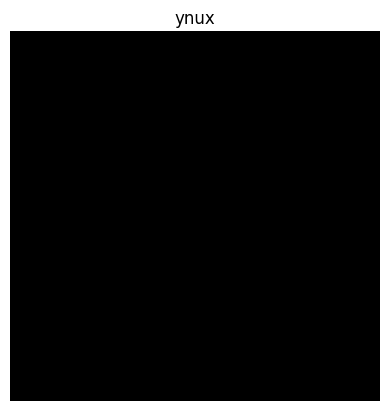

In [95]:
get_img('ynux')
# not a img of land but nearest creek
geodesic((35.974800, -78.756406), (35.976, -78.756639)).km

In [ ]:
# blackies have no patterns


How to deal with Cloudies?

,uid,latitude,longitude,date,split
911,bajg,38.99724,-108.0512,2017-07-23,train


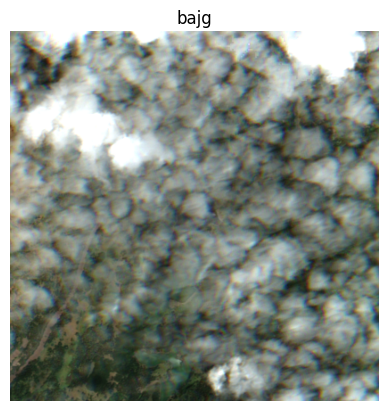

In [79]:
get_img('bajg')
# loc is land --> have to adjust to nearby waterbody and img is dammn cloudy

,uid,latitude,longitude,date,split
501,aotx,35.913003,-79.181928,2014-04-14,train


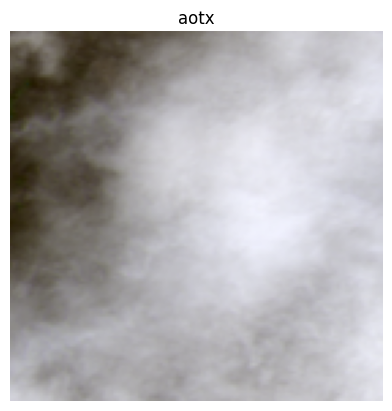

In [96]:
get_img('aotx')

,uid,latitude,longitude,date,split
13801,pevh,37.4583,-120.967,2014-01-14,train


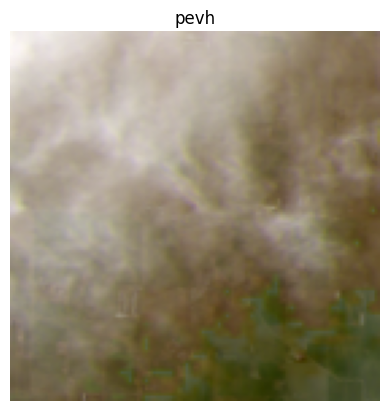

In [98]:
get_img('pevh')
# goodaam tough to identify the waterbody, have to figure out a way for these small bodies
# this thign is smaller than a creek! or probabily there might have been a lake but i can't see it now!

What are these stripes?

- seems like satellite movement patterns But why only for some pics?


['kzag', 'vaxu', 'swjx', 'okht', 'qmgq' ]


,uid,latitude,longitude,date,split
14979,qmgq,35.0228,-120.586,2014-08-25,test


0.1550632839004882 km


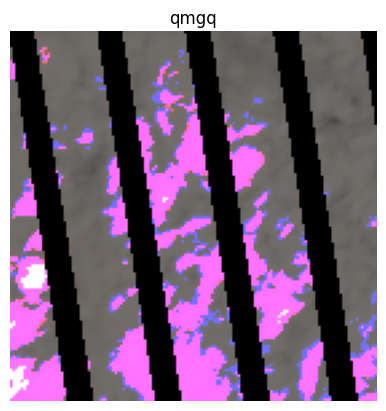

In [102]:
get_img('qmgq')
# given pic is land (striped--> probably old pic)
# but the nearest waterbody is a small creek .15km away
print(geodesic((35.023699, -120.584699), (35.0228, -120.586)))

In [71]:
cord_given = (35.0228,	-120.586)
cord_actual = (35.024603, -120.643491)

geodesic(cord_actual, cord_given).km    # qmgq is > 5km farther than givne point 

5.25054583019687

,uid,latitude,longitude,date,split
13060,okht,36.7081,-121.6,2015-08-25,test


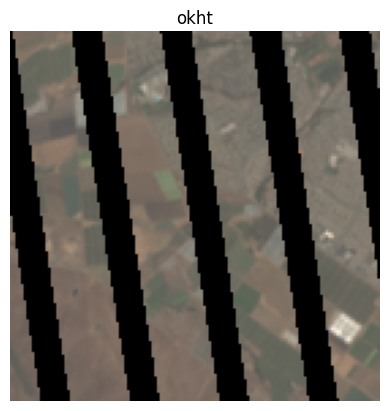

In [103]:
get_img('okht')
# this could most possibly be wrong data - no land at all

,uid,latitude,longitude,date,split
17157,swjx,34.2127,-78.916961,2013-05-13,test


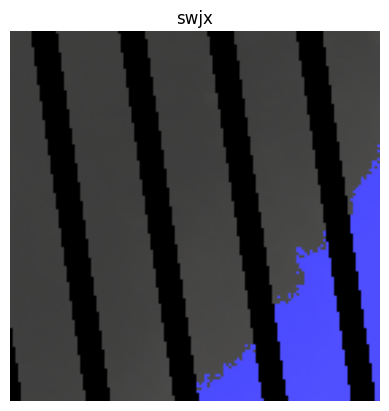

In [104]:
get_img('swjx')

,uid,latitude,longitude,date,split
19091,vaxu,37.6413,-121.229,2015-03-25,train


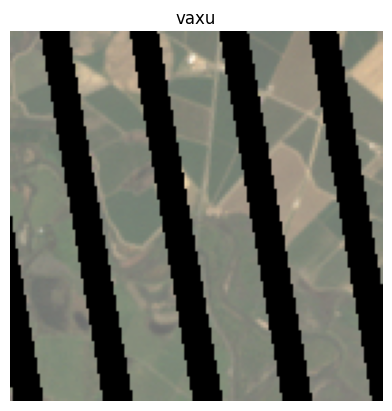

In [105]:
get_img('vaxu')

,uid,latitude,longitude,date,split
9999,kzag,36.3247,-119.079,2013-05-21,test


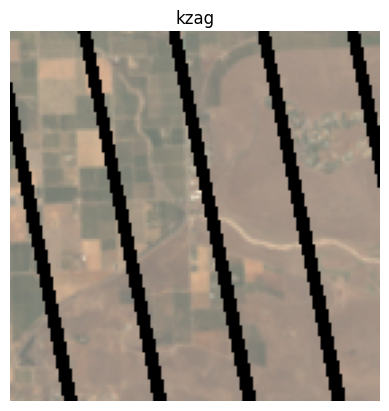

In [106]:
get_img('kzag')
# nearest one is a creek 

In [ ]:
# all the striped ones are older imgs (2013/14/15)

,uid,latitude,longitude,date,split
5975,gpej,38.1202,-121.583,2020-02-13,train


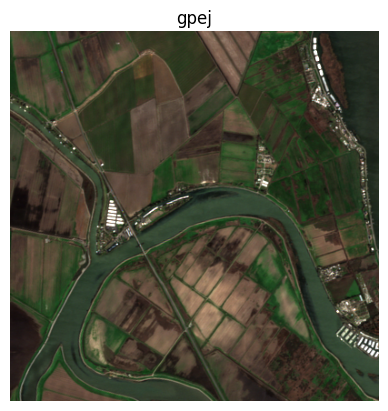

In [82]:
get_img('gpej')

In [14]:
import ee
# ee.Authenticate()
# ee.Initialize()

In [18]:
x, y

(array([41.5168]), array([-72.73]))

In [19]:
#  create a map with geemap
import geemap
Map = geemap.Map()
Map.add_basemap("HYBRID")
bbox = ee.Geometry.Rectangle(bbox)
Map.addLayer(bbox, {}, "image_41")
Map

Map(center=[20, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(children=(Togg…